In [1]:
!pip install ydata-profiling
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
from io import StringIO
from ydata_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')

In [2]:
url = "https://api.covidtracking.com/v1/states/daily.csv"

response = requests.get(url) #para obtener el contenido del archivo CSV, devuelve texto (no es archivo ni objeto, solo texto)

if response.status_code == 200:
    csv_data = StringIO(response.text) # convertirlo a un objeto de tipo StringIO para que pandas pueda leerlo(pandas necesita un archivo o un objeto q contenga texto en csv)
    df = pd.read_csv(csv_data)
else:
    print(f"Error al leer el dataframe: {response.status_code}")


In [3]:
df.sample()


,date,state,positive,probableCases,negative,pending,totalTestResultsSource,totalTestResults,hospitalizedCurrently,hospitalizedCumulative,...,dataQualityGrade,deathIncrease,hospitalizedIncrease,hash,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade
18872,20200404,AK,171.0,NaN,NaN,NaN,totalTestsViral,6040.0,NaN,17.0,...,NaN,2,0,dc81e7a1d6f6c0fb730c50dc2eecbc3ec6ca4ab2,0,0,0,0,0,NaN


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   date                         20780 non-null  int64  
 1   state                        20780 non-null  object 
 2   positive                     20592 non-null  float64
 3   probableCases                9271 non-null   float64
 4   negative                     13290 non-null  float64
 5   pending                      2138 non-null   float64
 6   totalTestResultsSource       20780 non-null  object 
 7   totalTestResults             20614 non-null  float64
 8   hospitalizedCurrently        17339 non-null  float64
 9   hospitalizedCumulative       12382 non-null  float64
 10  inIcuCurrently               11636 non-null  float64
 11  inIcuCumulative              3789 non-null   float64
 12  onVentilatorCurrently        9126 non-null   float64
 13  onVentilatorCumu

In [5]:
subset = df[["state", "date", "death", "deathIncrease","hospitalizedCumulative", "hospitalizedCurrently", "hospitalizedIncrease","positive",  "positiveIncrease", "negative", "totalTestResults", "totalTestResultsIncrease", "recovered" ]]

In [6]:
subset.dtypes

,0
state,object
date,int64
death,float64
deathIncrease,int64
hospitalizedCumulative,float64
hospitalizedCurrently,float64
hospitalizedIncrease,int64
positive,float64
positiveIncrease,int64
negative,float64


In [7]:
subset.head(2)

,state,date,death,deathIncrease,hospitalizedCumulative,hospitalizedCurrently,hospitalizedIncrease,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
0,AK,20210307,305.0,0,1293.0,33.0,0,56886.0,0,NaN,1731628.0,0,NaN
1,AL,20210307,10148.0,-1,45976.0,494.0,0,499819.0,408,1931711.0,2323788.0,2347,295690.0


In [8]:
# Convertir la fecha a formato datetime
subset['date'] = pd.to_datetime(subset['date'], format='%Y%m%d')

subset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   state                     20780 non-null  object        
 1   date                      20780 non-null  datetime64[ns]
 2   death                     19930 non-null  float64       
 3   deathIncrease             20780 non-null  int64         
 4   hospitalizedCumulative    12382 non-null  float64       
 5   hospitalizedCurrently     17339 non-null  float64       
 6   hospitalizedIncrease      20780 non-null  int64         
 7   positive                  20592 non-null  float64       
 8   positiveIncrease          20780 non-null  int64         
 9   negative                  13290 non-null  float64       
 10  totalTestResults          20614 non-null  float64       
 11  totalTestResultsIncrease  20780 non-null  int64         
 12  recovered         

In [9]:
# Ordenar por estado y fecha
subset = subset.sort_values(by=['state', 'date'])
subset.head(2)

,state,date,death,deathIncrease,hospitalizedCumulative,hospitalizedCurrently,hospitalizedIncrease,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
20451,AK,2020-03-06,0.0,0,NaN,NaN,0,NaN,0,NaN,8.0,0,NaN
20400,AK,2020-03-07,0.0,0,NaN,NaN,0,NaN,0,NaN,12.0,4,NaN


In [10]:
subset['state'].unique()

array(['AK', 'AL', 'AR', 'AS', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL',
       'GA', 'GU', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA',
       'MD', 'ME', 'MI', 'MN', 'MO', 'MP', 'MS', 'MT', 'NC', 'ND', 'NE',
       'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'PR', 'RI',
       'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VI', 'VT', 'WA', 'WI', 'WV',
       'WY'], dtype=object)

In [11]:
subset.describe().round(1)

,date,death,deathIncrease,hospitalizedCumulative,hospitalizedCurrently,hospitalizedIncrease,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
count,20780,19930.0,20780.0,12382.0,17339.0,20780.0,20592.0,20780.0,13290.0,20614.0,20780.0,12003.0
mean,2020-09-02 18:13:30.779595776,3682.2,24.8,9262.8,1190.6,37.4,165156.0,1383.8,848224.6,2186935.8,17508.4,94242.2
min,2020-01-13 00:00:00,0.0,-201.0,1.0,0.0,-12257.0,0.0,-7757.0,0.0,0.0,-130545.0,2.0
25%,2020-06-02 00:00:00,161.2,0.0,985.2,166.5,0.0,5753.8,65.0,53941.2,104049.8,1205.8,3379.0
50%,2020-09-03 00:00:00,1108.0,6.0,4472.0,531.0,0.0,46064.5,435.0,305972.0,655267.0,6125.0,17618.0
75%,2020-12-05 00:00:00,4387.5,24.0,12248.5,1279.0,36.0,177958.0,1335.2,1056611.2,2264766.5,19086.5,93152.5
max,2021-03-07 00:00:00,54124.0,2559.0,82237.0,22851.0,16373.0,3501394.0,71734.0,10186941.0,49646014.0,473076.0,2502609.0
std,NaN,6281.4,60.2,12620.5,2060.0,208.2,326785.2,3023.6,1344501.4,4436508.2,33586.0,211037.2


In [12]:
subset[subset['state'] == 'OH']

,state,date,death,deathIncrease,hospitalizedCumulative,hospitalizedCurrently,hospitalizedIncrease,positive,positiveIncrease,negative,totalTestResults,totalTestResultsIncrease,recovered
20511,OH,2020-03-05,NaN,0,NaN,NaN,0,0.0,0,NaN,NaN,0,NaN
20478,OH,2020-03-06,NaN,0,NaN,NaN,0,0.0,0,NaN,3.0,3,NaN
20435,OH,2020-03-07,NaN,0,NaN,NaN,0,0.0,0,NaN,5.0,2,NaN
20384,OH,2020-03-08,NaN,0,NaN,NaN,0,0.0,0,NaN,6.0,1,NaN
20333,OH,2020-03-09,NaN,0,NaN,NaN,0,3.0,3,NaN,8.0,2,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
262,OH,2021-03-03,17189.0,0,50613.0,1081.0,110,972605.0,2022,NaN,10101222.0,16741,916592.0
206,OH,2021-03-04,17189.0,0,50695.0,1009.0,82,974480.0,1875,NaN,10144547.0,43325,919296.0
150,OH,2021-03-05,17656.0,467,50782.0,919.0,87,976230.0,1750,NaN,10187678.0,43131,921707.0
94,OH,2021-03-06,17656.0,0,50848.0,922.0,66,977736.0,1506,NaN,10227868.0,40190,923986.0


In [13]:
subset[subset['state'] == 'CA']['positiveIncrease'].sum()
#subset[subset['state'] == 'CT']['positive'].max()

np.int64(3501341)

In [14]:
profile = ProfileReport(subset,title="USA Covid cases. Profiling Report", explorative=True,)
profile.to_file("output.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 29.11it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
from IPython.display import HTML # import the HTML object
HTML(filename='output.html') # render the file as a web page

In [16]:
rows_state = subset.groupby('state')[['state']].size()
na_state = subset.groupby('state')[['death', 'hospitalizedCurrently', 'hospitalizedCumulative', 'negative', 'recovered']].apply(lambda x: x.isna().sum())
perc_na = (na_state / rows_state.values[:, None]) * 100
perc_na = round(perc_na.fillna(0), 2)

print(perc_na)

       death  hospitalizedCurrently  hospitalizedCumulative  negative  \
state                                                                   
AK      0.00                  11.72                    0.82    100.00   
AL      2.19                   4.64                    7.65      0.82   
AR      4.36                   4.36                    7.08      0.00   
AS      0.56                 100.00                  100.00      4.20   
AZ      2.44                  10.84                    0.00      0.00   
CA      2.17                   6.23                  100.00     86.72   
CO      2.44                   4.61                    3.52      0.00   
CT      5.09                   5.90                   53.08    100.00   
DC      3.80                  12.23                  100.00    100.00   
DE      0.54                   5.18                  100.00      0.00   
FL     10.40                  40.35                   12.87      8.66   
GA      2.44                  15.72                

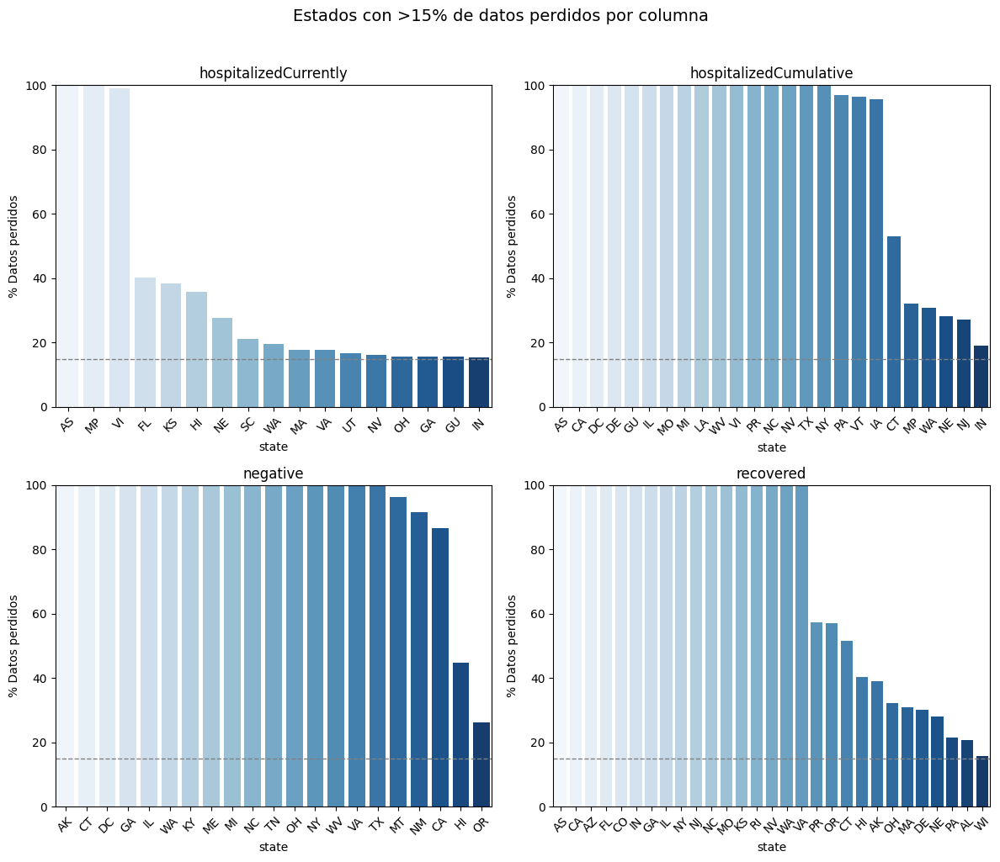

In [17]:
# Configuración general
columns_of_interest = ['death', 'hospitalizedCurrently', 'hospitalizedCumulative', 'negative', 'recovered']

# Crear figura con subplots (2 filas, 2 columnas)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # Ajustar para 2x2 subplots
fig.suptitle('Estados con >15% de datos perdidos por columna', y=1.02, fontsize=14)

# Aplanar los ejes para facilitar el acceso
axes = axes.flatten()

# Para contar cuántas columnas cumplen la condición
valid_columns = [col for col in columns_of_interest if not perc_na[perc_na[col] > 15][[col]].empty]

# Filtrar y graficar
for i, col in enumerate(valid_columns):
    # Filtrar estados con >15% NA en la columna actual
    filtered_data = perc_na[perc_na[col] > 15][[col]].sort_values(by=col, ascending=False)

    # Crear gráfico solo si hay datos
    if not filtered_data.empty:
        sns.barplot(x=filtered_data.index, y=filtered_data[col], ax=axes[i], palette='Blues')
        axes[i].set_title(f'{col}')
        axes[i].set_ylabel('% Datos perdidos')
        axes[i].set_ylim(0, 100)
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].axhline(15, color='grey', linestyle='--', linewidth=1)  # Línea de referencia
    else:
        axes[i].set_visible(False)  # Ocultar subplot si no hay datos

# Ajuste automático para no dejar subgráfico vacío
plt.tight_layout()
plt.show()


In [18]:
subset[subset['death'].isna()]['deathIncrease'].isna().sum()

np.int64(0)

In [19]:
subset['death'] = subset['death'].fillna(subset['death'].median()) # el unico campo con menos de 15% datos faltantes

In [20]:
subset['death'].isna().sum()

np.int64(0)

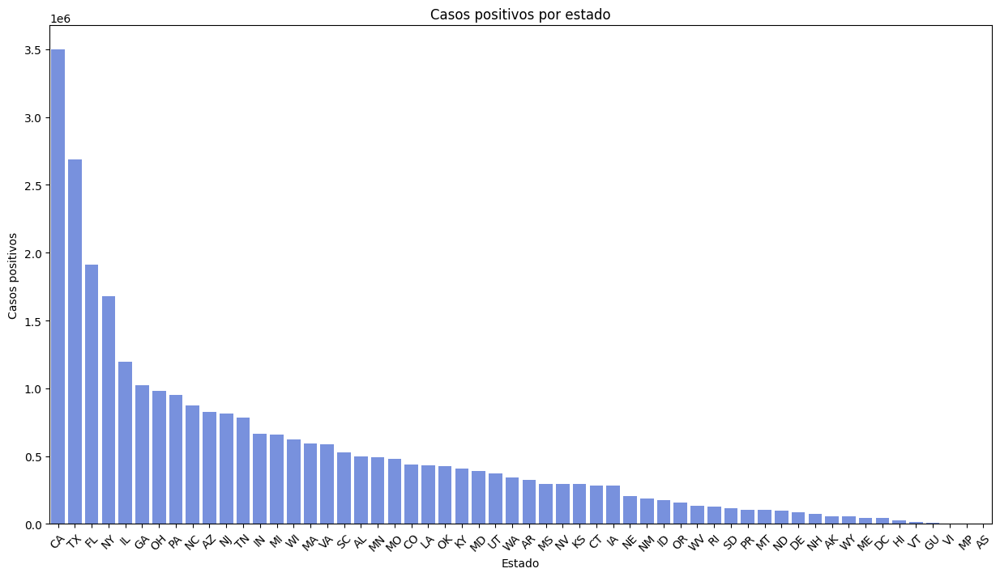

In [21]:
# Agrupamos por estado y sumamos los casos positivos
pos_state = subset.groupby('state').agg({
    'positiveIncrease': 'sum',
    'hospitalizedIncrease': 'sum'
}).reset_index()

# Gráfico de barras para mostrar los casos positivos acumulados por estado usando Seaborn y Matplotlib
plt.figure(figsize=(15, 8))
sns.set_palette('coolwarm')

# Ordenamos los estados por el número de casos positivos acumulados
pos_state_sorted = pos_state.sort_values(by='positiveIncrease', ascending=False)

# Creamos el gráfico de barras
sns.barplot(x='state', y='positiveIncrease', data=pos_state_sorted, order=pos_state_sorted['state'])

plt.title('Casos positivos por estado')
plt.xlabel('Estado')
plt.ylabel('Casos positivos')
plt.xticks(rotation=45)
plt.show()

In [22]:
# Paso 1: Calcular el total de casos positivos
total_positivos = pos_state['positiveIncrease'].sum()

# Paso 2: Ordenar los estados por el número de casos positivos acumulados
pos_state_sorted = pos_state.sort_values(by='positiveIncrease', ascending=False)

# Paso 3: Crear una nueva columna para el porcentaje acumulado de casos positivos
pos_state_sorted['cumulative_percentage'] = pos_state_sorted['positiveIncrease'].cumsum() / total_positivos * 100

# Paso 4: Filtrar los estados que suman hasta el 80% de los casos positivos
states_80_percent = pos_state_sorted[pos_state_sorted['cumulative_percentage'] <= 80]

# Mostrar los estados que contribuyen al 80% de los casos positivos, junto con hospitalizaciones
#print(states_80_percent[['state', 'positiveIncrease', 'cumulative_percentage', 'hospitalizedIncrease']])
print(states_80_percent)

   state  positiveIncrease  hospitalizedIncrease  cumulative_percentage
5     CA           3501341                     0              12.175870
47    TX           2686818                     0              21.519246
10    FL           1909209                 82237              28.158497
37    NY           1681169                     0              34.004741
16    IL           1198331                     0              38.171922
11    GA           1023485                 56797              41.731079
38    OH            978471                 50881              45.133699
41    PA            948643                     0              48.432594
30    NC            872175                     0              51.465571
4     AZ            826452                 57903              54.339548
34    NJ            812609                 64396              57.165386
46    TN            782205                 18870              59.885494
17    IN            667262                 43217              62

In [23]:
# Paso 1: Obtener la lista de estados en 'states_80_percent'
states_80_list = states_80_percent['state'].tolist()

# Paso 2: Filtrar el 'subset' para incluir solo los estados en 'states_80_list'
subset_80_percent = subset[subset['state'].isin(states_80_list)]

# solo los estados del 80%
print(subset_80_percent['state'].unique())


['AL' 'AZ' 'CA' 'CO' 'FL' 'GA' 'IL' 'IN' 'MA' 'MI' 'MN' 'MO' 'NC' 'NJ'
 'NY' 'OH' 'PA' 'SC' 'TN' 'TX' 'VA' 'WI']


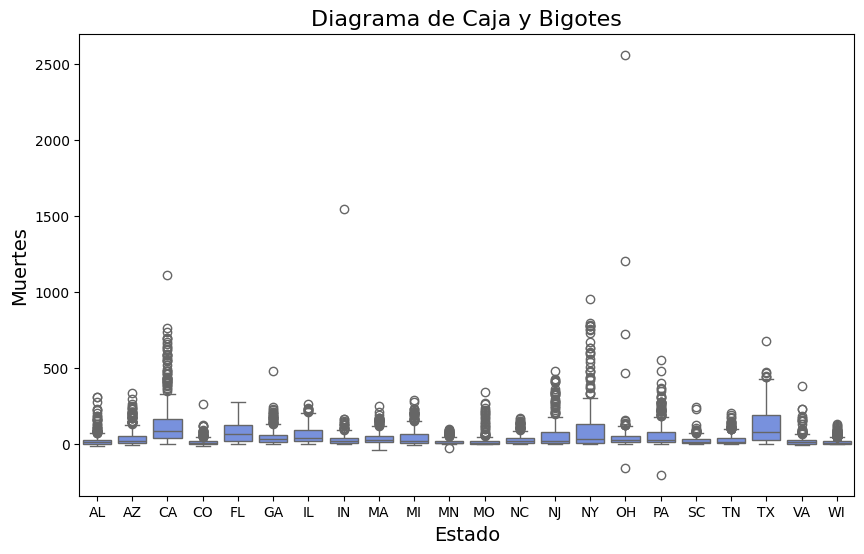

In [24]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='deathIncrease', data=subset_80_percent)

plt.title('Diagrama de Caja y Bigotes', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Muertes', fontsize=14)

plt.show()

In [25]:
def replace_negative_with_median(group):
    # Calcular la mediana del estado
    median_death = group['deathIncrease'].median()

    # Reemplazar los valores negativos por la mediana
    group['deathIncrease'] = group['deathIncrease'].apply(lambda x: median_death if x < 0 else x)

    return group

# Aplicar la función a cada grupo de estado
subset_80_percent = subset_80_percent.groupby('state').apply(replace_negative_with_median).reset_index(drop=True)

In [28]:
# Función para calcular y filtrar los outliers por estado
def remove_outliers_by_state(group):
    Q1 = group['death'].quantile(0.25)
    Q3 = group['death'].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filtrar el grupo para eliminar outliers
    group_cleaned = group[(group['death'] >= lower_bound) & (group['death'] <= upper_bound)]

    return group_cleaned

# Aplicar la función a cada grupo de estado
subset_80_percent = subset_80_percent.groupby('state').apply(remove_outliers_by_state).reset_index(drop=True)

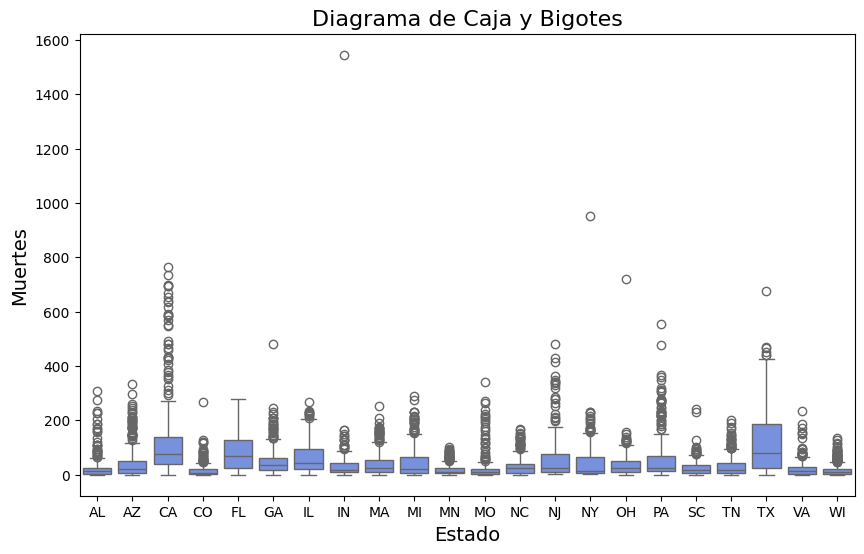

In [29]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='deathIncrease', data=subset_80_percent)

plt.title('Diagrama de Caja y Bigotes', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Muertes', fontsize=14)

plt.show()

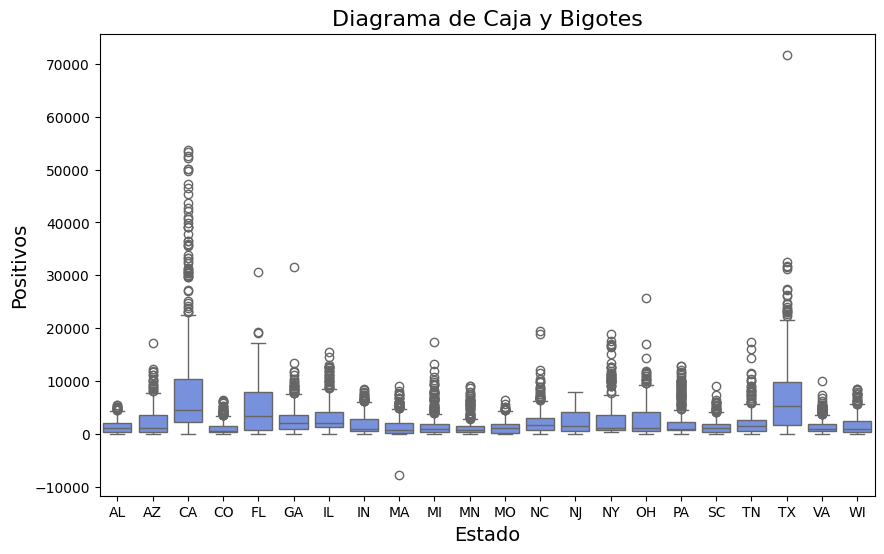

In [30]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='positiveIncrease', data=subset_80_percent)

plt.title('Diagrama de Caja y Bigotes', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Positivos', fontsize=14)

plt.show()

In [38]:
def replace_negative_with_median(group):
    # Calcular la mediana del estado
    median_death = group['positiveIncrease'].median()

    # Reemplazar los valores negativos por la mediana
    group['positiveIncrease'] = group['positiveIncrease'].apply(lambda x: median_death if x < 0 else x)

    return group

# Aplicar la función a cada grupo de estado
subset_80_percent = subset_80_percent.groupby('state').apply(replace_negative_with_median).reset_index(drop=True)

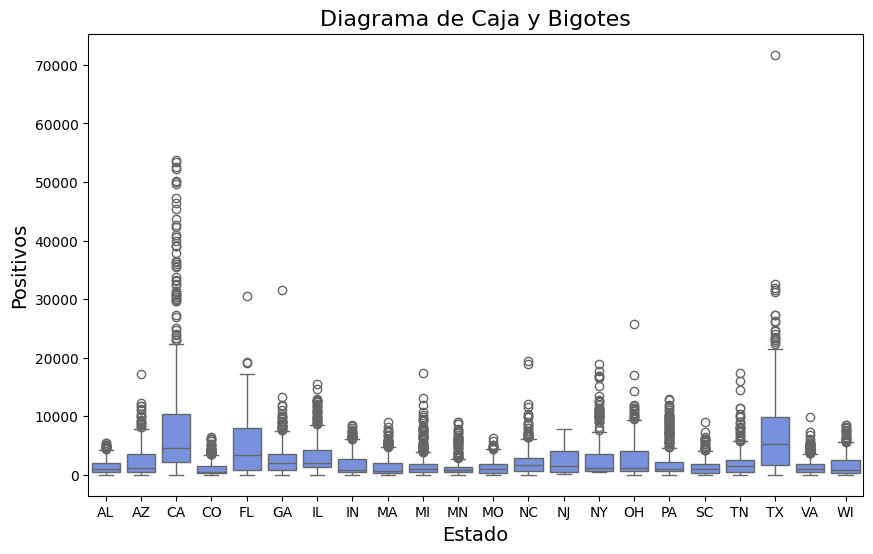

In [39]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='positiveIncrease', data=subset_80_percent)

plt.title('Diagrama de Caja y Bigotes', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Positivos', fontsize=14)

plt.show()

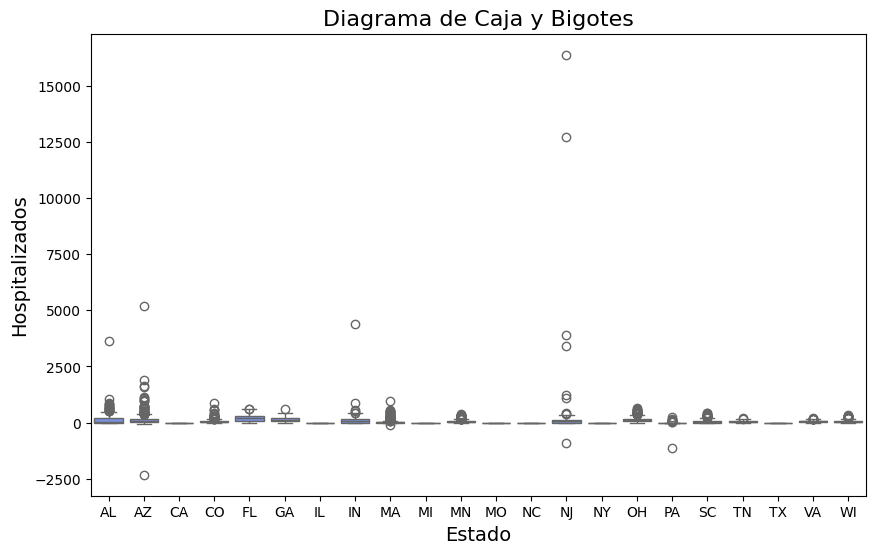

In [31]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='hospitalizedIncrease', data=subset_80_percent)

plt.title('Diagrama de Caja y Bigotes', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Hospitalizados', fontsize=14)

plt.show()

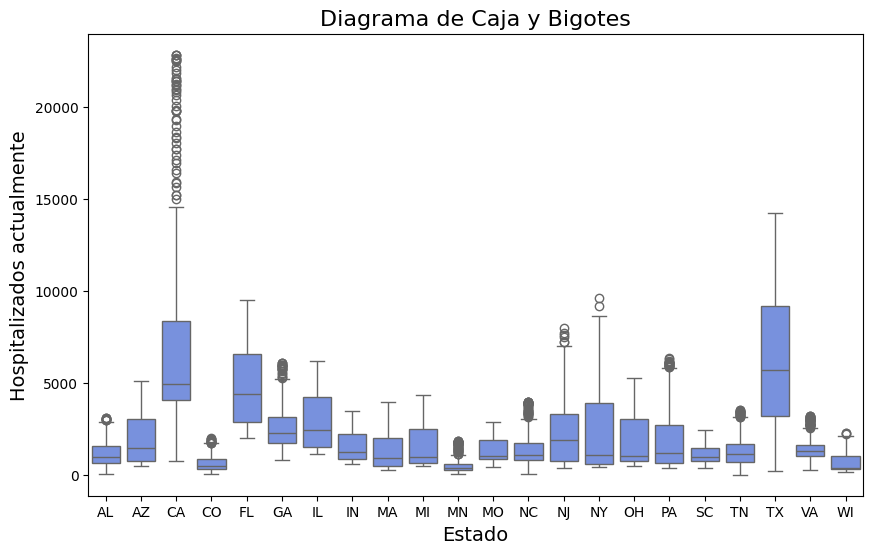

In [32]:
plt.figure(figsize=(10, 6))
box_plot = sns.boxplot(x='state', y='hospitalizedCurrently', data=subset_80_percent)

plt.title('Diagrama de Caja y Bigotes', fontsize=16)
plt.xlabel('Estado', fontsize=14)
plt.ylabel('Hospitalizados actualmente', fontsize=14)

plt.show()

In [33]:
# Agrupamos por estado y sumamos las muertes y casos positivos
mortality_state = subset.groupby('state').agg({
    'positiveIncrease': 'sum',
    'deathIncrease': 'sum',
    'hospitalizedIncrease': 'sum'
}).reset_index()

# Calculamos el ratio de mortalidad por estado

perc_na.reset_index(drop=True, inplace=True)
mortality_state.reset_index(drop=True, inplace=True)
mortality_state['hospit_rate'] = (mortality_state['hospitalizedIncrease'] / mortality_state['deathIncrease']) * 100 # hospitalizados por cada muerte, si es alto la at medica es buena
mortality_state['hospit_na_perc'] = perc_na['hospitalizedCurrently']
mortality_state['hospitCum_na_perc'] = perc_na['hospitalizedCumulative']

mortality_state['mortality_rate'] = (mortality_state['deathIncrease'] / mortality_state['positiveIncrease']) * 100



# Mostrar el ratio de mortalidad por estado
print(mortality_state.sort_values(by='mortality_rate', ascending=False))


   state  positiveIncrease  deathIncrease  hospitalizedIncrease  hospit_rate  \
34    NJ            812609          23574                 64396   273.165352   
21    MA            591356          16417                 19713   120.076750   
7     CT            285330           7704                     0     0.000000   
41    PA            948643          24349                     0     0.000000   
24    MI            656058          16658                     0     0.000000   
8     DC             41419           1030                     0     0.000000   
37    NY           1681169          39029                     0     0.000000   
28    MS            297581           6808                  9162   134.576968   
20    LA            433785           9748                     0     0.000000   
22    MD            387319           7955                 35651   448.158391   
35    NM            186922           3808                 13252   348.004202   
1     AL            499819          1014

In [34]:

# Reemplazar 'inf' por NaN en la tasa de mortalidad
mortality_state['mortality_rate'] = mortality_state['mortality_rate'].replace([np.inf, -np.inf], np.nan)

# Eliminar las filas con NaN en cualquier columna clave
mortality_state_clean = mortality_state.dropna(subset=['mortality_rate', 'hospitalizedIncrease', 'deathIncrease'])

# Calcular la matriz de correlación con los datos limpiados
correlation_matrix_clean = mortality_state_clean[['hospit_rate', 'mortality_rate', 'deathIncrease', 'hospitalizedIncrease']].corr()

# Ver la matriz de correlación limpia
print(correlation_matrix_clean)


                      hospit_rate  mortality_rate  deathIncrease  \
hospit_rate              1.000000       -0.439131      -0.276019   
mortality_rate          -0.439131        1.000000       0.345866   
deathIncrease           -0.276019        0.345866       1.000000   
hospitalizedIncrease     0.476919        0.131471       0.262716   

                      hospitalizedIncrease  
hospit_rate                       0.476919  
mortality_rate                    0.131471  
deathIncrease                     0.262716  
hospitalizedIncrease              1.000000  


In [35]:
#mortality_state.loc[3, 'mortality_rate'] = mortality_state['mortality_rate'].median()

correlat = mortality_state['hospit_rate'].corr(mortality_state['mortality_rate'])

print(f'Coeficiente de correlación entre mortalidad y hospitalización: {correlat}')

Coeficiente de correlación entre mortalidad y hospitalización: -0.43913078873390043


In [36]:
from scipy.stats import pearsonr

# Asumiendo que ya tienes los datos en dos variables: hospit_rate y mortality_rate
correlacion, valor_p = pearsonr(mortality_state['hospit_rate'], mortality_state['mortality_rate'])

print(f'Correlación: {correlacion}')
print(f'Valor p: {valor_p}')  # 5.48 x 10 º-8 (es muy muy pequeño. mucho menos q 0,05)

Correlación: nan
Valor p: nan


In [37]:
# Crear el DataFrame
data = {
    'state': ['AS', 'MP', 'VI'],
    'positive': [0.0, 24253.0, 373857.0],
    'deaths': [2216.0, 2893.0, 27260.0],
    'hospitalized': [0.0, 0.0, 9.0],
    'hospit_rate': [0.0, 0.0,
}

dataf = pd.DataFrame(data)

# Calcular la correlación entre 'death' y 'hospitalized'
correlation = dataf['deaths'].corr(dataf['hospitalized'])

print(f'Coeficiente de correlación entre "deaths" y "hospitalized": {correlation}')



SyntaxError: closing parenthesis '}' does not match opening parenthesis '[' on line 7 (<ipython-input-37-5a7c93524454>, line 8)

In [ ]:
# Crear el gráfico de dispersión con una línea de tendencia
plt.figure(figsize=(8, 6))
sns.regplot(x='hospitalized', y='deaths', data=dataf, scatter_kws={'s': 100}, line_kws={"color": "red"})

# Etiquetas y título
plt.title('Relación entre Hospitalizaciones y Muertes en As, MP y VI', fontsize=14)
plt.xlabel('Hospitalizaciones', fontsize=12)
plt.ylabel('Muertes', fontsize=12)
plt.grid(True)

# Mostrar gráfico
plt.show()


In [ ]:

mortality_state.loc[3, 'mortality_rate']